---
date: 13-04-2024
author: Martin Proks & Nazmus Salehin
title: Reviewer comments
---

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import seaborn as sns

import scvi
import scanpy as sc
import cellrank as cr
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler


import scvelo as scv
scv.set_figure_params('scvelo')

import warnings
warnings.simplefilter("ignore", category=UserWarning)

/home/fdb589/projects/data/Brickman/conda/envs/scvi-1.0.0/lib/python3.10/site-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
  self.seed = seed
/home/fdb589/projects/data/Brickman/conda/envs/scvi-1.0.0/lib/python3.10/site-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.
  self.dl_pin_memory_gpu_training = (


In [2]:
%run ../scripts/helpers.py

In [3]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '2'

In [4]:
import jax
jax.devices()

[gpu(id=0)]

In [5]:
from scvi.model import SCANVI

In [219]:
plt.rcParams['svg.fonttype'] = 'none'

## Reviewer #1

### Guo et al., 2021


```bash
nf-core_tower.sh Guo_2021 \
    nextflow run nf-core/fetchngs \
    -r 1.11.0 \
    --input /projects/dan1/data/Brickman/projects/proks-salehin-et-al-2023/pipeline/fetchngs/human_GSE166422.tsv

nf-core_tower.sh Guo_2021 nextflow run brickmanlab/scrnaseq \
    -r feature/smartseq \
    -c /projects/dan1/data/Brickman/projects/proks-salehin-et-al-2023/pipeline/10X.human.config \
    --input /scratch/Brickman/pipelines/Guo_2021_fixed10X/results/samplesheet/samplesheet.corrected.csv
```

Analysis from the paper

> all cells expressing fewer than 3000 genes or more than 10% mitochondrial genes were removed
> 
> scale factor of 10,000 and finally natural-log (log1p) transformed
>
> The top 2000 most variably expressed genes

In [73]:
guo = sc.read("../data/external/aligned/human/guo_2021_reprocessed.h5ad")

guo.obs['experiment'] = 'Guo et al., 2021'
guo.obs['sample'] = guo.obs.sample_title.str[:-2].astype('category')
guo.obs['batch'] = 'Batch_1'

guo.obs['stage'] = 'D1'
guo.obs.loc[guo.obs['sample'] == 'HNES1-D3', 'stage'] = 'D3'
guo.obs.loc[guo.obs['sample'] == 'HNES1-D5-P18', 'stage'] = 'D5'
guo.obs.loc[guo.obs['sample'] == 'HNES1-PXGL', 'stage'] = 'PXGL'
guo.obs = guo.obs[['batch', 'experiment', 'sample', 'stage']]
guo.layers['counts'] = guo.X

In [74]:
guo.shape

(41650, 62754)

In [75]:
guo.var["mt"] = guo.var.gene_symbol.str.startswith("MT-")
sc.pp.calculate_qc_metrics(guo, qc_vars=["mt"], inplace=True, log1p=True)
sc.pp.filter_cells(guo, min_genes=3_000)
guo = guo[guo.obs.pct_counts_mt <= 10].copy()

In [76]:
guo.shape

(18811, 62754)

In [77]:
sc.pp.normalize_total(guo, target_sum=10_000)
sc.pp.log1p(guo)
sc.pp.highly_variable_genes(guo, n_top_genes=2_000)
sc.tl.pca(guo)
sc.pp.neighbors(guo)
sc.tl.umap(guo)

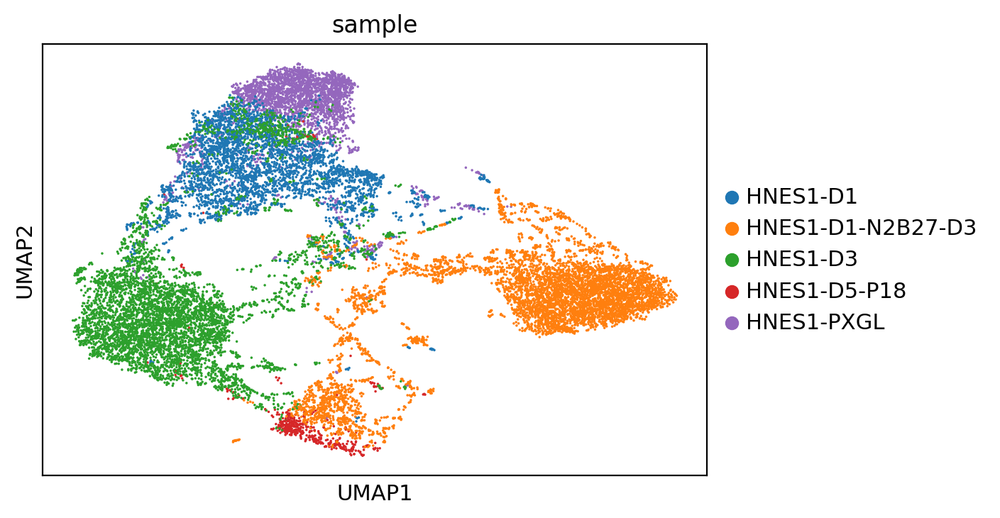

In [78]:
sc.pl.umap(guo, color=['sample'])

In [79]:
lvae = scvi.model.SCANVI.load("../results/02_human_integration/05_scanvi_ns15/")
scvi.model.SCANVI.prepare_query_anndata(guo, lvae)

lvae_q = scvi.model.SCANVI.load_query_data(guo, lvae)
lvae_q.train(max_epochs=100, plan_kwargs=dict(weight_decay=0.0), check_val_every_n_epoch=10)

INFO     File ../results/02_human_integration/05_scanvi_ns15/model.pt already downloaded                           
INFO     Found 100.0% reference vars in query data.                                                                
INFO     Training for 100 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Epoch 100/100: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [03:04<00:00,  1.88s/it, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.16e+3]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [03:04<00:00,  1.85s/it, v_num=1, train_loss_step=1.16e+3, train_loss_epoch=1.16e+3]


In [80]:
guo.obs['prediction'] = lvae_q.predict()
guo.obs['entropy'] = 1 - lvae_q.predict(soft=True).max(axis=1)

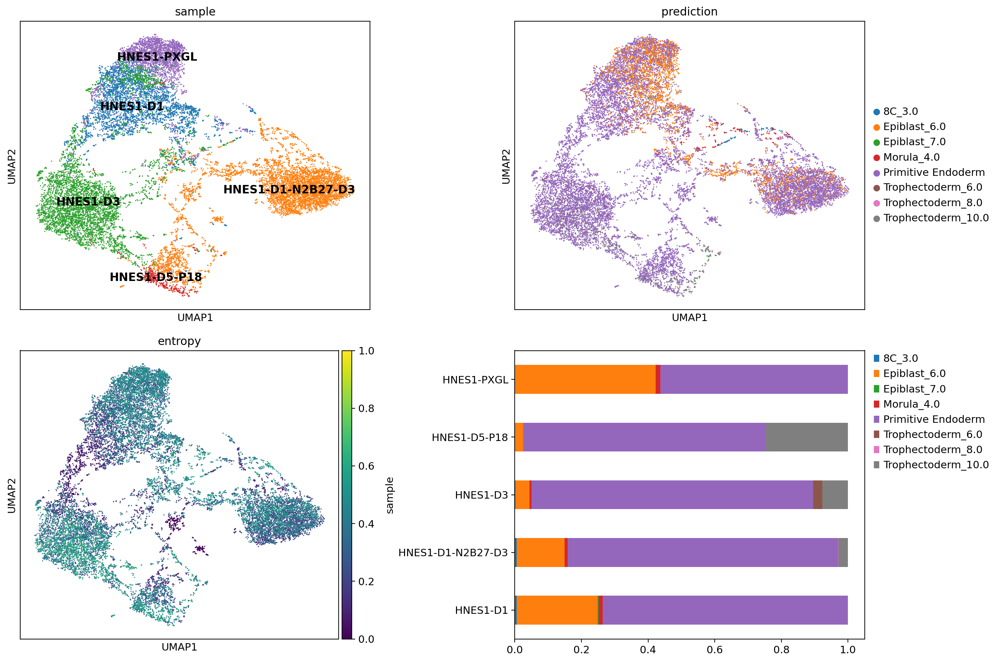

In [104]:
fig, ax = plt.subplots(2,2, figsize=[15,10])
sc.pl.umap(guo, color='sample', ax=ax[0, 0], show=False, legend_loc='on data')
sc.pl.umap(guo, color='prediction', ax=ax[0, 1], show=False)
sc.pl.umap(guo, color='entropy', vmax=1, vmin=0, cmap='viridis', ax=ax[1, 0], show=False)
sc.metrics.confusion_matrix('sample', 'prediction', guo.obs).plot.barh(stacked=True, ax=ax[1,1])
ax[1,1].legend(bbox_to_anchor=(1, 1.02), frameon=False)
fig.tight_layout()
fig.savefig('../figures/13_guo_1.png')

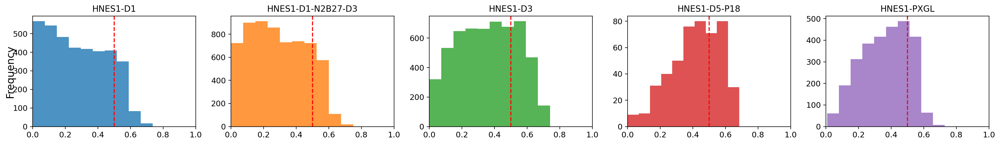

In [105]:
fig, ax = plt.subplots(1, 5, figsize=[20, 3], sharex=True)
for idx, sample in enumerate(guo.obs['sample'].cat.categories):
    guo.obs.query('sample == @sample')['entropy'].plot.hist(ax=ax[idx], xlim=(0, 1), color=guo.uns['sample_colors'][idx], alpha=0.8)
    ax[idx].axvline(0.5, c='r', ls='--')
    ax[idx].set_title(sample)
    ax[idx].set_ylabel('')
fig.supylabel('Frequency')
fig.tight_layout()
fig.savefig('../figures/13_guo_2.png')

In [106]:
guo.write('../results/13_guo.h5ad')

### nEnd

In [129]:
# RAW counts
nned_raw = sc.read('../data/external/linneberg_et_al_2024/00_merged.h5ad')
nned_raw.var = nned_raw.var.set_index('_index')

# Processed dataset from 13_.qmd
nned = sc.read('../data/external/linneberg_et_al_2024/Madie_nEnd_cellPaper_normalised.h5ad')
nned.layers['counts'] = nned_raw[nned.obs_names, nned.var_names].X
nned.obs.columns = nned.obs.columns.str.lower()
nned.obs['experiment'] = 'Linnenber et al., 2024'
nned.obs['technology'] = "10X 3' v3"

nned.var_names = nned.var_names.str.lower()
nned.obs.seurat_clusters = nned.obs.seurat_clusters.astype('str')

In [ ]:
# Quick fix, converstion from Seurat to AnnData
del nned.varm['PCs']

In [134]:
lvae = scvi.model.SCANVI.load("../results/02_mouse_integration/scanvi_ns_15/")
scvi.model.SCANVI.prepare_query_anndata(nned, lvae)

lvae_q = scvi.model.SCANVI.load_query_data(nned, lvae)
lvae_q.train(max_epochs=100, plan_kwargs=dict(weight_decay=0.0), check_val_every_n_epoch=10)

INFO     File ../results/02_mouse_integration/scanvi_ns_15/model.pt already downloaded                             
INFO     Found 90.2% reference vars in query data.                                                                 
INFO     Training for 100 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Epoch 100/100: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [02:33<00:00,  1.52s/it, v_num=1, train_loss_step=861, train_loss_epoch=829]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [02:33<00:00,  1.54s/it, v_num=1, train_loss_step=861, train_loss_epoch=829]


In [135]:
nned.obs['prediction'] = lvae_q.predict()
nned.obs['entropy'] = 1 - lvae_q.predict(soft=True).max(axis=1)

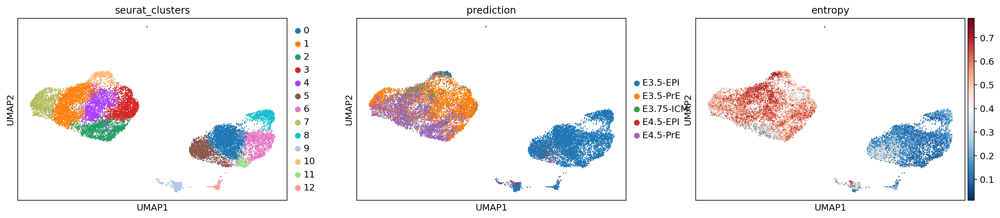

In [139]:
sc.pl.umap(nned, color=['seurat_clusters', 'prediction', 'entropy'])

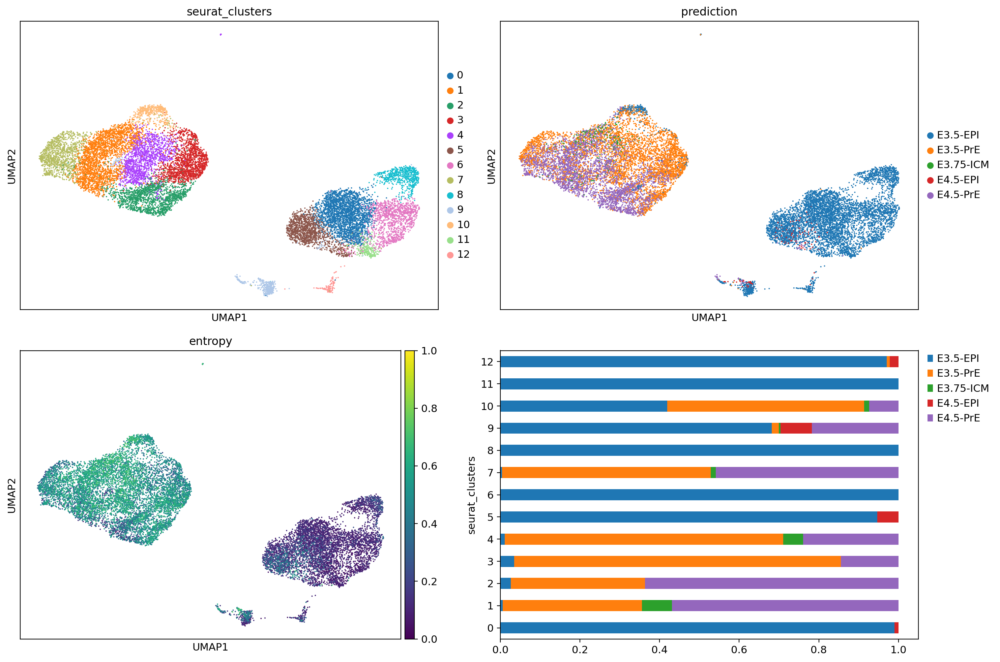

In [143]:
fig, ax = plt.subplots(2,2, figsize=[15,10])
sc.pl.umap(nned, color='seurat_clusters', ax=ax[0, 0], show=False)
sc.pl.umap(nned, color='prediction', ax=ax[0, 1], show=False)
sc.pl.umap(nned, color='entropy', vmax=1, vmin=0, cmap='viridis', ax=ax[1, 0], show=False)
sc.metrics.confusion_matrix('seurat_clusters', 'prediction', nned.obs).plot.barh(stacked=True, ax=ax[1,1])
ax[1,1].legend(bbox_to_anchor=(1, 1.02), frameon=False)
fig.tight_layout()
fig.savefig('../figures/13_nned_1.png')

## Reviewer #2

### Accuracy of training data

In [144]:
from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score

In [145]:
lvae_mouse = scvi.model.SCANVI.load("../results/02_mouse_integration/scanvi_ns_15/")
lvae_mouse.adata.obs["predictions"] = lvae_mouse.predict()
lvae_mouse.adata.obs.predictions = lvae_mouse.adata.obs.predictions.astype('category')

INFO     File ../results/02_mouse_integration/scanvi_ns_15/model.pt already downloaded                             


In [146]:
stats = []
for ds in lvae_mouse.adata.obs.experiment.unique():
    df = lvae_mouse.adata.obs.query('experiment == @ds')
    
    stats.append([
        ds, 
        accuracy_score(df.ct, df.predictions),
        balanced_accuracy_score(df.ct, df.predictions),
        f1_score(df.ct, df.predictions, average='micro'),
        f1_score(df.ct, df.predictions, average='macro')
    ])

stats = pd.DataFrame(stats, columns=['dataset', 'Accuracy', 'Balanced Accuracy', 'F1 (micro)', 'F1 (macro)'])
stats

,dataset,Accuracy,Balanced Accuracy,F1 (micro),F1 (macro)
0,"Deng et al., 2014",0.653333,0.744538,0.653333,0.472441
1,"Biase et al., 2014",0.803571,0.730000,0.803571,0.420875
2,"Posfai et al., 2017",0.793103,0.764931,0.793103,0.489859
3,"Goolamn et al., 2016",0.949153,0.750000,0.949153,0.500000
4,"Boroviak et al., 2015",0.600000,0.666667,0.600000,0.466667
5,"Chen et al., 2016",0.065217,0.065217,0.065217,0.034762
6,"Nowotschin et al., 2019",0.838645,0.888939,0.838645,0.744309
7,"Fan et al., 2015",0.777778,0.805128,0.777778,0.792857
8,"Borensztein et al., 2017",0.933333,0.965517,0.933333,0.939815
9,"Stirparo et al., 2020",0.453125,0.722222,0.453125,0.326531


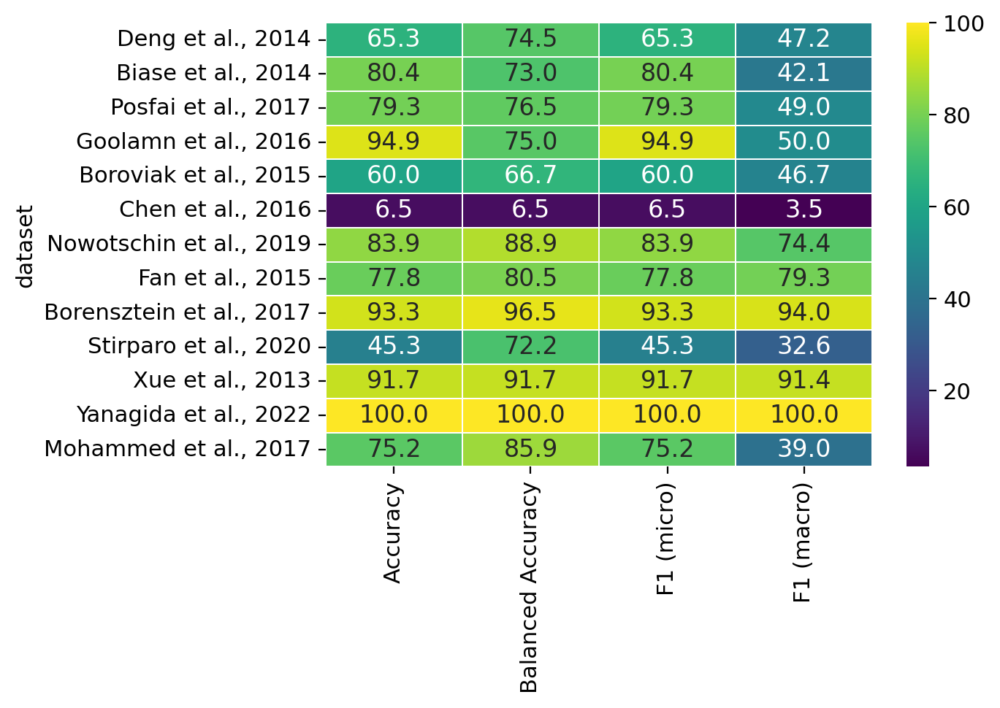

In [148]:
sns.heatmap(linewidths=0.1, fmt=".1f", cmap='viridis', annot=True, data=(stats.set_index('dataset') * 100).round(2))
plt.savefig("../figures/13_rev2_accuracies.svg")

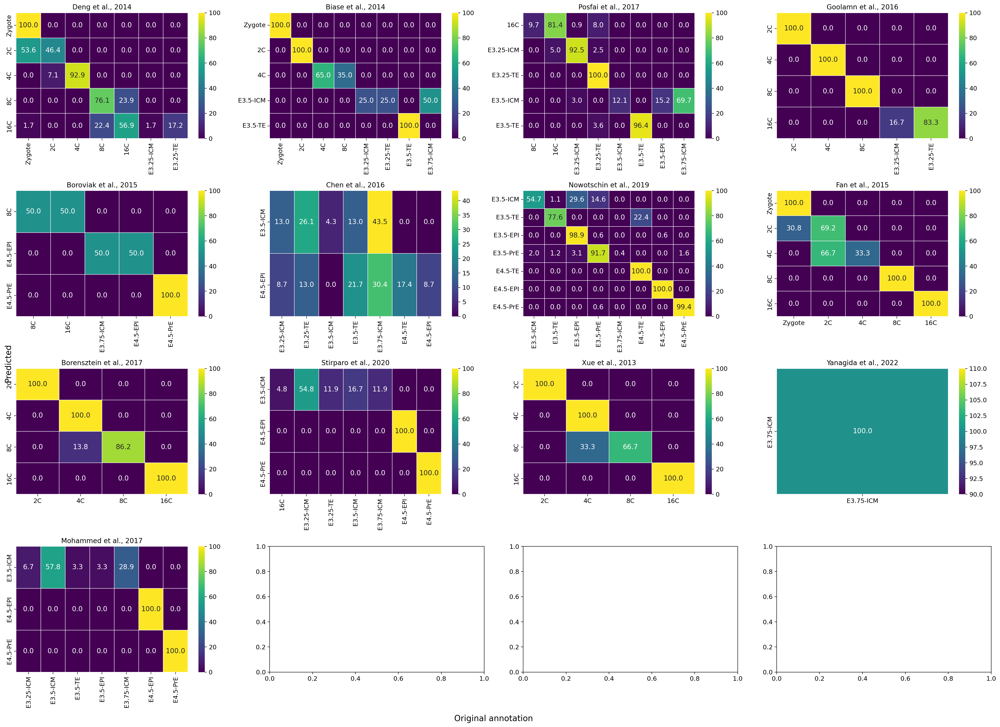

In [128]:
fig, ax = plt.subplots(4, 4, figsize=[25, 18])

for idx, ds in enumerate(lvae_mouse.adata.obs.experiment.unique()):
    df = lvae_mouse.adata.obs.query('experiment == @ds')
    norm = pd.crosstab(df.ct, df.predictions)
    norm /= norm.sum(axis=1).values.reshape(-1,1)
    norm *= 100

    order_x = lvae_mouse.adata.obs.ct.cat.categories.intersection(norm.index)
    order_y = lvae_mouse.adata.obs.ct.cat.categories.intersection(norm.columns)
    tmp = pd.DataFrame(0, index=order_x, columns=order_y) + norm
    tmp = tmp.fillna(0).loc[order_x,order_y]

    sns.heatmap(annot=True, fmt=".1f", linewidths=0.1, cmap='viridis', data=tmp, ax=ax[idx // 4, idx % 4])
    ax[idx // 4, idx % 4].set_title(ds)

fig.supxlabel('Original annotation')
fig.supylabel('Predicted')
fig.tight_layout()
fig.savefig("../figures/13_rev2_heatmaps.svg")

### How does modulation of `ns` influence the classification?

In [149]:
mouse = sc.read("../results/03_mouse.processed.h5ad")
human = sc.read("../results/03_human.processed.h5ad")

ct_colors = {
    'Prelineage': '#7985A5',
    '8C_3.0': '#028A46',
    'Morula_4.0': '#657cbd',
    'Inner Cell Mass': '#F6C445',
    'Primitive Endoderm': '#D05B61',
    'Epiblast_6.0': '#d6b2ca',
    'Epiblast_7.0': '#c38db1',
    'Late epiblast': '#aa5c8f',
    'Trophectoderm_5.0': '#cddff0',
    'Trophectoderm_6.0': '#bdd4eb',
    'Trophectoderm_7.0': '#acc9e6',
    'Trophectoderm_8.0': '#9cbfe2',
    'Trophectoderm_9.0': '#8bb4dd',
    'Trophectoderm_10.0': '#5a94ce',
    'Unknown': '#F1BD93',
}

In [155]:
mouse.obs.ct.value_counts()[::-1]

Zygote        18
E4.5-TE       28
E3.25-ICM     40
E3.25-TE      47
E3.75-ICM     48
2C            86
E3.5-TE      107
E4.5-EPI     108
4C           114
8C           115
E3.5-EPI     175
16C          198
E4.5-PrE     207
E3.5-PrE     254
E3.5-ICM     459
Name: ct, dtype: int64

In [156]:
human.obs.ct.value_counts()[::-1]

Morula_4.0             19
8C_3.0                 30
Late epiblast          35
Prelineage             39
Trophectoderm_8.0      46
Epiblast_7.0           46
Trophectoderm_9.0      53
Primitive Endoderm     59
Trophectoderm_10.0     60
Epiblast_6.0           76
Inner Cell Mass       140
Trophectoderm_5.0     246
Trophectoderm_6.0     403
Trophectoderm_7.0     462
Unknown               609
Name: ct, dtype: int64

In [176]:
from tqdm.notebook import trange

In [177]:
clf_bootstraps = pd.DataFrame()
clf_bootstraps['ct_fine'] = sc.read("../results/02_human_integration/scanvi/adata.h5ad").obs.ct_fine
clf_bootstraps['C_scANVI_nsamples'] = sc.read("../results/02_human_integration/05_scanvi_ns15/adata.h5ad").obs.C_scANVI_nsamples

for i in trange(10):
    lvae_human = scvi.model.SCANVI.from_scvi_model(scvi.model.SCVI.load("../results/02_human_integration/scvi/"), labels_key="ct_fine", unlabeled_category="Unknown")
    lvae_human.train(n_samples_per_label = 10, enable_progress_bar=False)

    clf_bootstraps[f'iter_{i}'] = lvae_human.predict()

clf_bootstraps.to_csv("../results/13_human_bootstrap_clfs_preds.csv")

  0%|          | 0/10 [00:00<?, ?it/s]

INFO     File ../results/02_human_integration/scvi/model.pt already downloaded                                     
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
`Trainer.fit` stopped: `max_epochs=10` reached.


INFO     File ../results/02_human_integration/scvi/model.pt already downloaded                                     
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
`Trainer.fit` stopped: `max_epochs=10` reached.


INFO     File ../results/02_human_integration/scvi/model.pt already downloaded                                     
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
`Trainer.fit` stopped: `max_epochs=10` reached.


INFO     File ../results/02_human_integration/scvi/model.pt already downloaded                                     
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
`Trainer.fit` stopped: `max_epochs=10` reached.


INFO     File ../results/02_human_integration/scvi/model.pt already downloaded                                     
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
`Trainer.fit` stopped: `max_epochs=10` reached.


INFO     File ../results/02_human_integration/scvi/model.pt already downloaded                                     
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
`Trainer.fit` stopped: `max_epochs=10` reached.


INFO     File ../results/02_human_integration/scvi/model.pt already downloaded                                     
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
`Trainer.fit` stopped: `max_epochs=10` reached.


INFO     File ../results/02_human_integration/scvi/model.pt already downloaded                                     
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
`Trainer.fit` stopped: `max_epochs=10` reached.


INFO     File ../results/02_human_integration/scvi/model.pt already downloaded                                     
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
`Trainer.fit` stopped: `max_epochs=10` reached.


INFO     File ../results/02_human_integration/scvi/model.pt already downloaded                                     
INFO     Training for 10 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
`Trainer.fit` stopped: `max_epochs=10` reached.


In [192]:
clf_bootstraps

,ct_fine,C_scANVI_nsamples,iter_0,iter_1,iter_2,iter_3,iter_4,iter_5,iter_6,iter_7,iter_8,iter_9
index,,,,,,,,,,,,
ERX3015937_ERX3015937,Unknown,Epiblast_6.0,Trophectoderm_5.0,Inner Cell Mass,Epiblast_6.0,Trophectoderm_5.0,Inner Cell Mass,Inner Cell Mass,Trophectoderm_5.0,Inner Cell Mass,Trophectoderm_5.0,Epiblast_6.0
ERX3015939_ERX3015939,Unknown,Epiblast_6.0,Epiblast_7.0,Inner Cell Mass,Epiblast_6.0,Epiblast_6.0,Inner Cell Mass,Inner Cell Mass,Trophectoderm_5.0,Epiblast_6.0,Epiblast_6.0,Epiblast_6.0
ERX3015940_ERX3015940,Unknown,Epiblast_6.0,Morula_4.0,Trophectoderm_5.0,Epiblast_6.0,Trophectoderm_5.0,Inner Cell Mass,Inner Cell Mass,Trophectoderm_5.0,Epiblast_6.0,Trophectoderm_5.0,Epiblast_6.0
ERX3015941_ERX3015941,Unknown,Inner Cell Mass,Morula_4.0,Inner Cell Mass,Epiblast_6.0,Trophectoderm_5.0,Inner Cell Mass,Inner Cell Mass,Trophectoderm_5.0,Inner Cell Mass,Trophectoderm_5.0,Epiblast_6.0
ERX3015936_ERX3015936,Unknown,Trophectoderm_5.0,Epiblast_7.0,Trophectoderm_5.0,Trophectoderm_5.0,Trophectoderm_5.0,Trophectoderm_5.0,Trophectoderm_5.0,Trophectoderm_5.0,Trophectoderm_5.0,Trophectoderm_5.0,Trophectoderm_5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
SRX300884_SRX300884,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage
SRX300876_SRX300876,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage
SRX300882_SRX300882,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage,Prelineage


In [224]:
clf_bootstraps.ct_fine = clf_bootstraps.ct_fine.cat.reorder_categories(ct_colors.keys(), ordered=True)
clf_bootstraps.C_scANVI_nsamples = clf_bootstraps.C_scANVI_nsamples.cat.reorder_categories(list(ct_colors.keys())[:-1], ordered=True)

Text(158.51909722222226, 0.5, 'Original annotation')

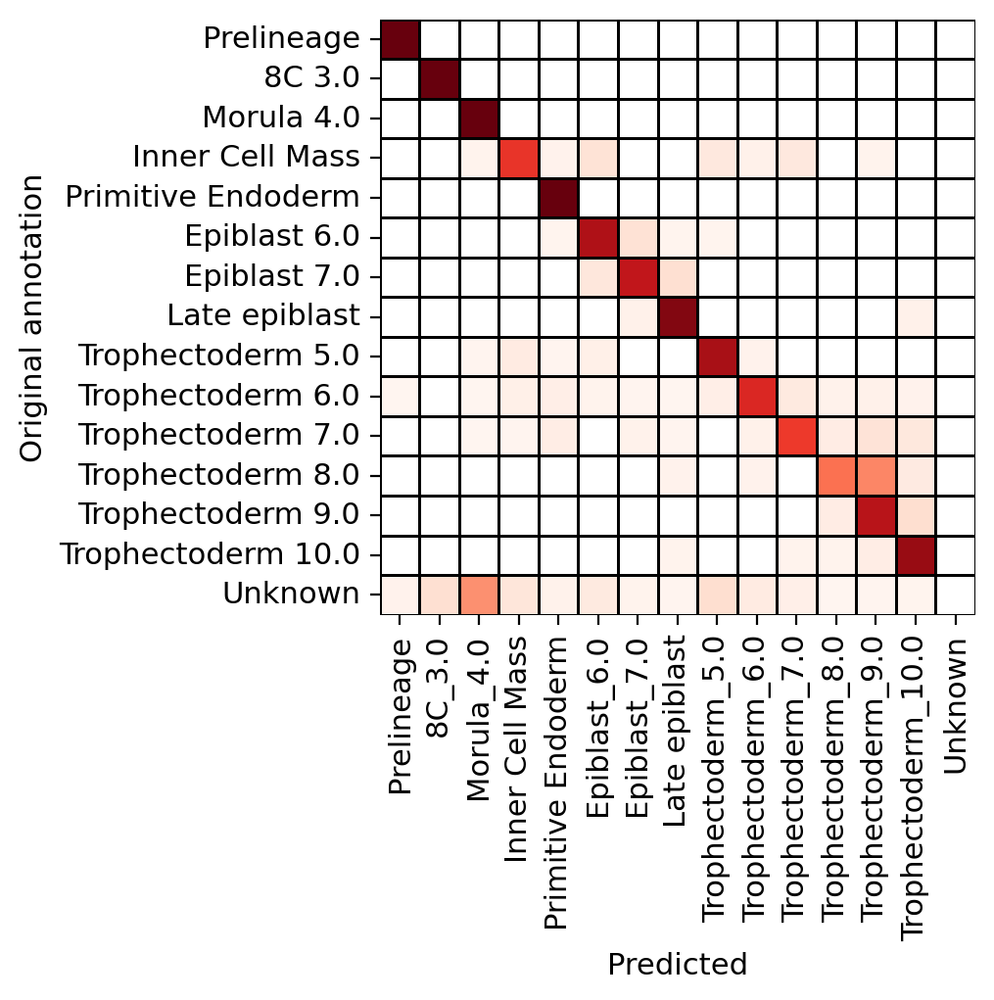

In [225]:
df = pd.DataFrame(0, index=clf_bootstraps.ct_fine.cat.categories, columns=clf_bootstraps.ct_fine.cat.categories) + sc.metrics.confusion_matrix("ct_fine", "C_scANVI_nsamples", clf_bootstraps)
df = df[clf_bootstraps.ct_fine.cat.categories]
df[df == 0] = np.nan
_ = sns.heatmap(df, linewidths=0.2, cmap='Reds', square=True, cbar=None, linewidth=.5, linecolor='black').set(xlabel='', ylabel='', yticklabels=clf_bootstraps.ct_fine.cat.categories.str.replace('_', ' '))
plt.xlabel('Predicted')
plt.ylabel('Original annotation')

In [274]:
clf_bootstraps_sub = clf_bootstraps.query('ct_fine != "Unknown"').copy()
metrics = [
    [
        col,
        accuracy_score(clf_bootstraps_sub.ct_fine, clf_bootstraps_sub[col]),
        balanced_accuracy_score(clf_bootstraps_sub.ct_fine, clf_bootstraps_sub[col]),
        f1_score(clf_bootstraps_sub.ct_fine, clf_bootstraps_sub[col], average='micro'),
        f1_score(clf_bootstraps_sub.ct_fine, clf_bootstraps_sub[col], average='macro')
    ]
    for col in clf_bootstraps_sub.columns[1:]
]
metrics = pd.DataFrame(metrics).set_index(0)
metrics.columns=['Accuracy', 'Balanced Accuracy', 'F1 (micro)', 'F1 (macro)']
metrics['group'] = ['scANVI [ns=15]'] + ['scANVI [ns=10]'] * 10

<Axes: ylabel='0'>

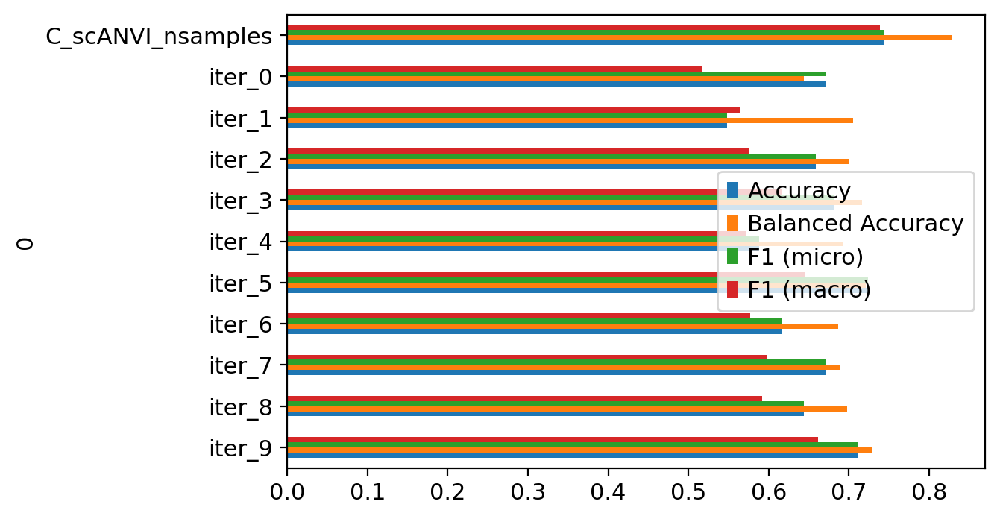

In [275]:
metrics[::-1].plot.barh()

In [276]:
metrics

,Accuracy,Balanced Accuracy,F1 (micro),F1 (macro),group
0,,,,,
C_scANVI_nsamples,0.743874,0.828582,0.743874,0.738653,scANVI [ns=15]
iter_0,0.672112,0.643781,0.672112,0.517329,scANVI [ns=10]
iter_1,0.547841,0.705651,0.547841,0.564845,scANVI [ns=10]
iter_2,0.658693,0.699560,0.658693,0.576406,scANVI [ns=10]
iter_3,0.682030,0.716844,0.682030,0.617463,scANVI [ns=10]
iter_4,0.588098,0.692631,0.588098,0.571362,scANVI [ns=10]
iter_5,0.723454,0.721218,0.723454,0.645721,scANVI [ns=10]
iter_6,0.617270,0.686379,0.617270,0.577372,scANVI [ns=10]
iter_7,0.671529,0.688704,0.671529,0.598457,scANVI [ns=10]


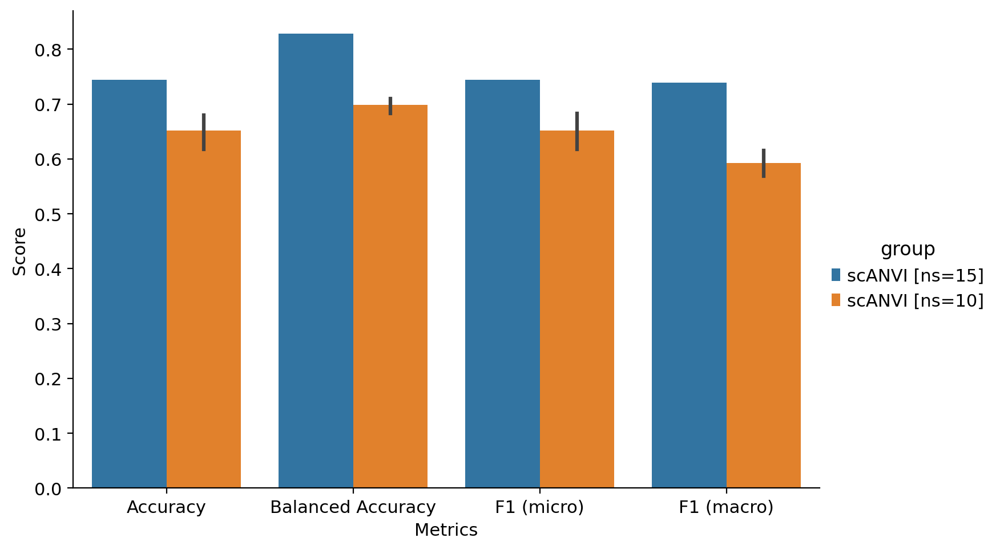

In [281]:
sns.catplot(x='variable', y='value', hue='group', kind='bar', aspect=1.5,
            data=metrics.reset_index().melt(id_vars=[0, 'group']))
plt.xlabel('Metrics')
plt.ylabel('Score')
plt.savefig('../figures/13_ns_comparison.png')

## Reviewer #3

### scANVI reannotation clarrification

In [326]:
human = sc.read("../results/03_human.processed.h5ad")
human.obs[['updated_ct', 'C_scANVI', 'C_scANVI_nsamples']] = sc.read("../results/02_human_integration/05_scanvi_ns15/adata.h5ad").obs[['updated_ct', 'C_scANVI', 'C_scANVI_nsamples']]
human.obs['entropy'] = 1 - scvi.model.SCANVI.load("../results/02_human_integration/05_scanvi_ns15/").predict(soft=True).max(axis=1).values

INFO     File ../results/02_human_integration/05_scanvi_ns15/model.pt already downloaded                           


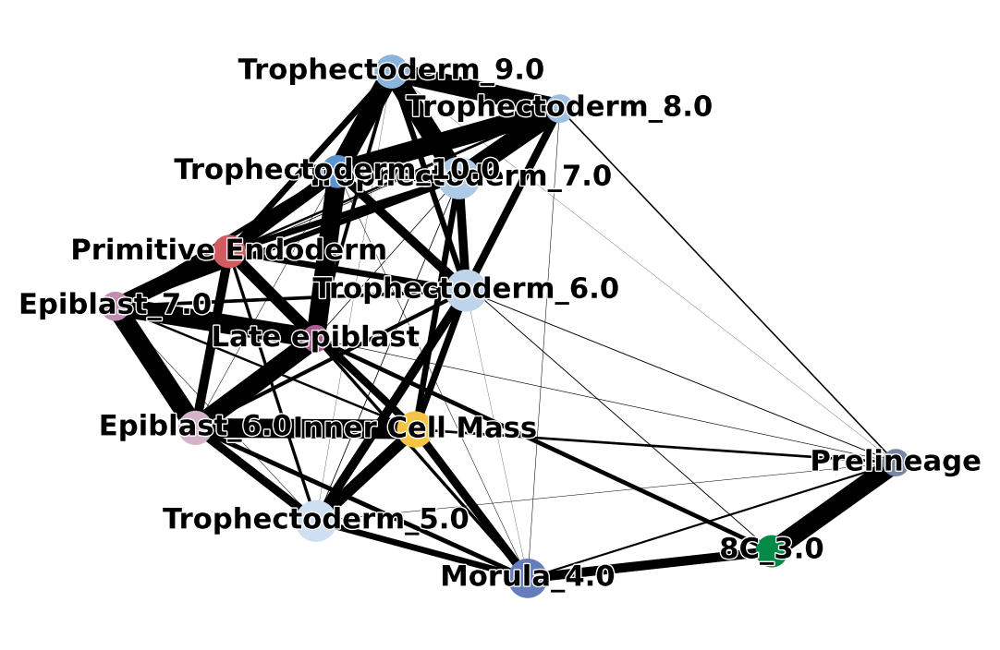

In [327]:
# human_scfates.obs['C_scANVI_nsamples'] = scvi.model.SCANVI.load("../results/02_human_integration/05_scanvi_ns15/").adata.obs.C_scANVI_nsamples
human.uns['C_scANVI_nsamples_colors'] = [ct_colors[x] for x in human.obs.C_scANVI_nsamples.cat.categories]

sc.tl.paga(human, groups='C_scANVI_nsamples')
sc.pl.paga(human, color=['C_scANVI_nsamples'], frameon=False, fontoutline=True)
sc.tl.draw_graph(human, init_pos='paga', n_jobs=10)

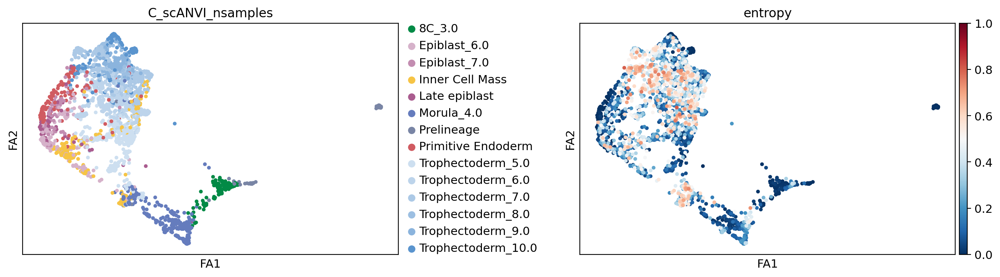

In [409]:
ax = sc.pl.draw_graph(human, color=['C_scANVI_nsamples', 'entropy'], vmin=0, vmax=1, wspace=0.35, return_fig=True)
ax.savefig('../figures/13_entropy_ds.png')

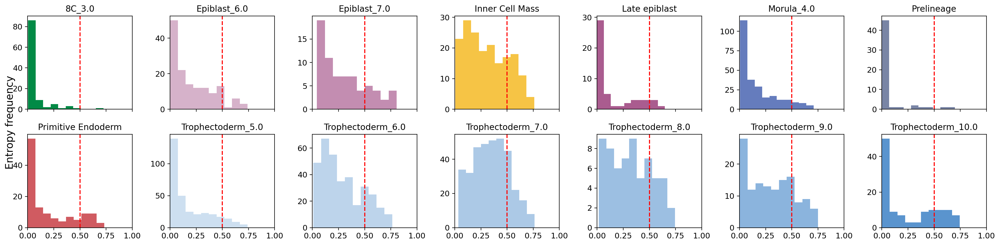

In [410]:
fig, ax = plt.subplots(2, 7, figsize=[20, 5], sharex=True)
for idx, ct in enumerate(human.obs.C_scANVI_nsamples.cat.categories):
    human.obs.query('C_scANVI_nsamples == @ct')['entropy'].plot.hist(label=ct, ax=ax[idx // 7, idx % 7], color=ct_colors[ct])
    ax[idx // 7, idx % 7].set_title(ct)
    ax[idx // 7, idx % 7].set_ylabel('')
    ax[idx // 7, idx % 7].set_xlim(0, 1)
    ax[idx // 7, idx % 7].axvline(0.5, c='r', ls='--')
fig.supylabel('Entropy frequency')
fig.tight_layout()
fig.savefig('../figures/13_entropy_hist.png')

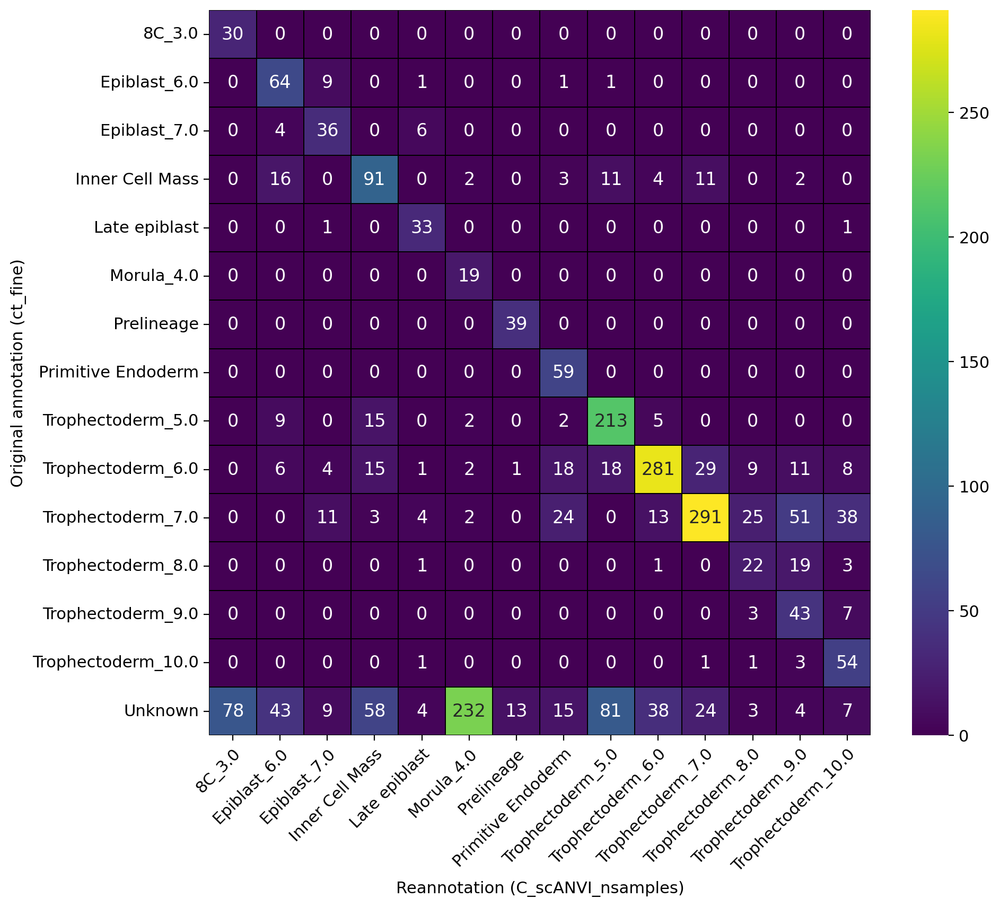

In [411]:
fig = plt.figure(figsize=[10, 9])
sns.heatmap(cmap='viridis', linewidths=0.1, linecolor='black', annot=True, fmt='d',
            data=sc.metrics.confusion_matrix('ct_fine', 'C_scANVI_nsamples', data=human.obs, normalize=False).round())
_ = plt.xticks(rotation=45, ha='right', rotation_mode='anchor')
plt.ylabel('Original annotation (ct_fine)')
plt.xlabel('Reannotation (C_scANVI_nsamples)')
fig.savefig('../figures/13_entropy_reannot.png')

### XGBoost overfit

In [6]:
import xgboost as xgb
import matplotlib.colors as mcolors

In [7]:
vitro = sc.read("../data/external/Proks_et_al_2023/02_dataset.h5ad")

vitro_raw = sc.AnnData(vitro.raw.X, var=vitro.raw.var, obs=vitro.obs)
vitro_raw.var_names = vitro_raw.var_names.str.lower()
vitro_raw.layers['counts'] = vitro_raw.X
vitro_raw
vitro_raw.obs['batch'] = vitro_raw.obs['Batch']
vitro_raw.obs['technology'] = "MARS-seq"

mouse_vitro = vitro_raw.copy()

# FACS
hhex_protein = vitro.obs['All.Events.mCherry.561D-A.Geo.Mean']
hhex_cutoff = hhex_protein.median() + hhex_protein.std()
sox2_protein = vitro.obs['All.Events.GFP-A.Geo.Mean']
sox2_cutoff = sox2_protein.median() + sox2_protein.std()
vitro.obs['FACS'] = "Unknown"
vitro.obs.loc[vitro.obs['All.Events.mCherry.561D-A.Geo.Mean'] > hhex_cutoff, 'FACS'] = 'Hhex+'
vitro.obs.loc[vitro.obs['All.Events.GFP-A.Geo.Mean'] > hhex_cutoff, 'FACS'] = 'Sox2+'

mouse_stats = pd.DataFrame()
mouse_stats['FACS'] = vitro.obs.FACS.values

In [8]:
vae = scvi.model.SCVI.load("../results/02_mouse_integration/scvi/")
mouse_xg_scVI = xgb.XGBClassifier()
mouse_xg_scVI.load_model("../results/02_mouse_integration/05_scVI_xgboost.json")

scvi.model.SCVI.prepare_query_anndata(mouse_vitro, vae)
vae_q = scvi.model.SCVI.load_query_data(mouse_vitro, vae)
vae_q.train(max_epochs=100, plan_kwargs=dict(weight_decay=0.0), check_val_every_n_epoch=10, enable_progress_bar=False)

denoised = vae_q.get_normalized_expression(return_mean=True)
preds = mouse_xg_scVI.predict(denoised)
mouse_stats['XGBoost[scVI]'] = vae.adata.obs.ct.cat.categories[preds]

INFO     File ../results/02_mouse_integration/scvi/model.pt already downloaded                                     
INFO     Found 76.6% reference vars in query data.                                                                 


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
`Trainer.fit` stopped: `max_epochs=100` reached.


In [9]:
lvae = scvi.model.SCANVI.load("../results/02_mouse_integration/scanvi_ns_15/")
mouse_xg_scANVI = xgb.XGBClassifier()
mouse_xg_scANVI.load_model("../results/02_mouse_integration/05_scANVI_xgboost.json")

scvi.model.SCANVI.prepare_query_anndata(mouse_vitro, lvae)
lvae_q = scvi.model.SCANVI.load_query_data(mouse_vitro, lvae)
lvae_q.train(max_epochs=100, plan_kwargs=dict(weight_decay=0.0), check_val_every_n_epoch=10, enable_progress_bar=False)

denoised = lvae_q.get_normalized_expression(return_mean=True)
preds = mouse_xg_scANVI.predict(denoised)
mouse_stats['XGBoost[scANVI]'] = lvae.adata.obs.ct.cat.categories[preds]

INFO     File ../results/02_mouse_integration/scanvi_ns_15/model.pt already downloaded                             
INFO     Found 100.0% reference vars in query data.                                                                
INFO     Training for 100 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]
`Trainer.fit` stopped: `max_epochs=100` reached.


In [11]:
mouse_stats['original'] = sc.read("../results/06_proks_et_al.h5ad").obs.predictions.values

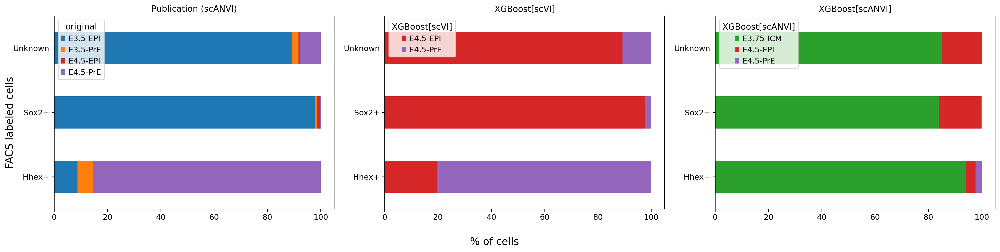

In [16]:
fig, ax = plt.subplots(1, 3, figsize=[20, 5])
tmp_colors = dict(zip(sorted(mouse_stats.stack().unique()), mcolors.TABLEAU_COLORS.keys()))

(sc.metrics.confusion_matrix('FACS', 'original', mouse_stats) * 100).plot.barh(stacked=True, ax=ax[0], title='Publication (scANVI)', color=tmp_colors)
(sc.metrics.confusion_matrix('FACS', 'XGBoost[scVI]', mouse_stats) * 100).plot.barh(stacked=True, ax=ax[1], title='XGBoost[scVI]', color=tmp_colors)
(sc.metrics.confusion_matrix('FACS', 'XGBoost[scANVI]', mouse_stats) * 100).plot.barh(stacked=True, ax=ax[2], title='XGBoost[scANVI]', color=tmp_colors)

for ax_ in ax:
    ax_.set_ylabel('')

fig.supxlabel('% of cells')
fig.supylabel('FACS labeled cells')
fig.tight_layout()
fig.savefig('../figures/13_xgb_mouse_vitro.png')

# plt.gca().spines[['right', 'top']].set_visible(False)
# plt.title('in vitro mouse PrE conpositional prediction XGBoost[scVI]')

### Extending the reference dataset with Day 12 and Day 14 cells from Xiang et al.

In [44]:
gtf = pd.read_table("../data/external/human/Homo_sapiens.GRCh38.110.gene_length.tsv", index_col=0)
gene_lengths = gtf[['mean']].copy()
gene_lengths.columns = ['length']
def normalize_smartseq(adata: sc.AnnData, gene_len: pd.DataFrame) -> sc.AnnData:
    print("SMART-SEQ: Normalization")

    common_genes = adata.var_names.intersection(gene_len.index)
    print(f"SMART-SEQ: Common genes {common_genes.shape[0]}")

    lengths = gene_len.loc[common_genes, "length"].values
    normalized = sc.AnnData(adata[:, common_genes].X, obs=adata.obs, dtype=np.float32)
    normalized.var_names = common_genes
    normalized.X = normalized.X / lengths * np.median(lengths)
    normalized.X = np.rint(normalized.X)

    return normalized

In [45]:
xiang_h5ad = sc.read_h5ad("../data/external/aligned/human/xiang_2020_reprocessed.h5ad")
xiang_metadata_1 = pd.read_table("https://ftp.ncbi.nlm.nih.gov/geo/series/GSE136nnn/GSE136447/matrix/GSE136447-GPL20795_series_matrix.txt.gz", 
                              skiprows=29, nrows=1, index_col = 0).T
xiang_metadata_2 = pd.read_table("https://ftp.ncbi.nlm.nih.gov/geo/series/GSE136nnn/GSE136447/matrix/GSE136447-GPL23227_series_matrix.txt.gz", 
                              skiprows=29, nrows=1, index_col = 0).T
xiang_metadata = pd.concat([xiang_metadata_1, xiang_metadata_2])
xiang_metadata['Sample_name'] = xiang_metadata.index.to_list()
xiang_metadata['Sample_name'] = xiang_metadata['Sample_name'].str.extract("_(.*$)")
xiang_sample_annotation = pd.read_excel("../data/external/human/deprecated/Xiang_et_al_2019/41586_2019_1875_MOESM10_ESM.xlsx", skiprows=2, index_col=0)
xiang_sample_annotation = xiang_sample_annotation.merge(xiang_metadata, left_on='Sample ID', right_on = 'Sample_name')
xiang_sample_annotation.columns = ['Day', 'Embryo ID', 'Group', 'GEO_accession', 'Sample_name']

xiang = xiang_h5ad.copy()

xiang.obs = xiang_h5ad.obs.loc[:,['sample','sample_alias']].reset_index().merge(xiang_sample_annotation, left_on='sample_alias', right_on='GEO_accession').set_index('index')

In [46]:
xiang_reannotation = xiang.obs
day_renaming = {
    'D10':10,
    'D12':12,
    'D14':14,
    'D6':6,
    'D7':7,
    'D8':8,
    'D9':9,
}

group_renaming = {
    'CTB':'Trophectoderm',
    'EPI':'Epiblast',
    'EVT':'Trophectoderm',
    'ICM':'Inner Cell Mass',
    'PSA-EPI':'PS_Anlage-Epiblast',
    'PrE':'Primitive Endoderm',
    'STB':'Trophectoderm'
}

xiang_reannotation = xiang_reannotation.replace({'Day':day_renaming, 'Group': group_renaming})

In [47]:
xiang_reannotation = xiang_reannotation[['Day', 'Group']].copy()
xiang_reannotation.columns = ['day', 'ct']
xiang_reannotation['experiment'] = 'Xiang_extended_2020'
xiang_reannotation['technology'] = 'SMARTSeq2'
xiang_reannotation.head()

,day,ct,experiment,technology
index,,,,
SRX6774526_SRX6774526,12,Trophectoderm,Xiang_extended_2020,SMARTSeq2
SRX6774449_SRX6774449,6,Epiblast,Xiang_extended_2020,SMARTSeq2
SRX6774468_SRX6774468,6,Epiblast,Xiang_extended_2020,SMARTSeq2
SRX6774508_SRX6774508,12,Trophectoderm,Xiang_extended_2020,SMARTSeq2
SRX6774478_SRX6774478,10,Epiblast,Xiang_extended_2020,SMARTSeq2


In [48]:
xiang.obs = xiang_reannotation
xiang = xiang[xiang.obs.day >= 12].copy()

In [49]:
normalize_smartseq(xiang, gene_lengths)

SMART-SEQ: Normalization
SMART-SEQ: Common genes 62663


AnnData object with n_obs × n_vars = 224 × 62663
    obs: 'day', 'ct', 'experiment', 'technology'

In [50]:
sc.pp.filter_cells(xiang, min_counts=10)
sc.pp.filter_cells(xiang, min_genes=10)
xiang.layers["counts"] = xiang.X.copy()
sc.pp.normalize_total(xiang, target_sum=10_000)
sc.pp.log1p(xiang)
xiang.raw = xiang

In [51]:
xiang.obs.day = pd.to_numeric(xiang.obs.day)
xiang.obs['ct_fine'] = xiang.obs.ct.astype(str) + '_' + xiang.obs.day.astype(str)
xiang.obs['batch'] = xiang.obs.experiment

In [52]:
xiang_extend = xiang.copy()

In [53]:
xiang_extend

AnnData object with n_obs × n_vars = 224 × 62754
    obs: 'day', 'ct', 'experiment', 'technology', 'n_counts', 'n_genes', 'ct_fine', 'batch'
    var: 'gene_symbol'
    uns: 'log1p'
    layers: 'counts'

In [54]:
xiang_extend.write_h5ad('../data/processed/13_xiang_extend_adata.h5ad')

#### Fetch the current model

In [8]:
from scvi.hub import HubModel
import anndata as ad

In [9]:
hmo = HubModel.pull_from_huggingface_hub(
    repo_name="brickmanlab/human-scanvi",
    cache_dir="../data/processed/human_scanvi_model_downloaded/",
    revision="main",
)

Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

In [69]:
hmo.adata

AnnData object with n_obs × n_vars = 2323 × 3000
    obs: 'day', 'ct', 'experiment', 'technology', 'n_counts', 'n_genes', 'ct_fine', 'batch', 'stage', 'timepoint', 'ct_orig', '_scvi_batch', '_scvi_labels', 'updated_ct', 'C_scANVI', 'C_scANVI_nsamples'
    var: 'symbol', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg'
    obsm: 'X_mde_scANVI', 'X_mde_scVI', 'X_scANVI', 'X_scVI'
    layers: 'counts', 'scANVI_normalized', 'scVI_normalized'

Concatenate the adata

In [70]:
xiang_extend

AnnData object with n_obs × n_vars = 224 × 62754
    obs: 'day', 'ct', 'experiment', 'technology', 'n_counts', 'n_genes', 'ct_fine', 'batch'
    var: 'gene_symbol'
    uns: 'log1p'
    layers: 'counts'

In [71]:
extended_adata = ad.concat([hmo.adata, xiang_extend])

In [72]:
extended_adata

AnnData object with n_obs × n_vars = 2547 × 3000
    obs: 'day', 'ct', 'experiment', 'technology', 'n_counts', 'n_genes', 'ct_fine', 'batch'
    layers: 'counts'

Train the models

In [73]:
scvi.model.SCVI.setup_anndata(
    extended_adata, 
    layer="counts", 
    batch_key="batch",
)

extended_vae = scvi.model.SCVI(extended_adata, n_layers=2, gene_likelihood='nb')
extended_vae

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 2, dropout_rate: 0.1, dispersion: gene, gene_likelihood: nb, 
latent_distribution: normal
Training status: Not Trained
Model's adata is minified?: False

In [74]:
extended_vae.train(use_gpu=0, max_epochs=400, early_stopping=True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Epoch 370/400:  92%|▉| 370/400 [01:15<00:06,  4.88it/s, v_num=1, train_
Monitored metric elbo_validation did not improve in the last 45 records. Best score: 7682.097. Signaling Trainer to stop.


In [75]:
extended_adata.obsm["X_scVI"] = extended_vae.get_latent_representation(extended_adata)
extended_adata.layers['scVI_normalized'] = extended_vae.get_normalized_expression(return_numpy=True)

In [76]:
extended_lvae = scvi.model.SCANVI.from_scvi_model(
    extended_vae,
    adata=extended_adata,
    labels_key="ct",
    unlabeled_category="Unknown",
)
extended_lvae

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 10, n_layers: 2, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: nb
Training status: Not Trained
Model's adata is minified?: False

In [77]:
extended_lvae.train(max_epochs=15)

INFO     Training for 15 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Epoch 15/15: 100%|█| 15/15 [00:07<00:00,  2.08it/s, v_num=1, train_loss

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 15/15: 100%|█| 15/15 [00:07<00:00,  2.07it/s, v_num=1, train_loss


In [78]:
extended_adata.obsm["X_scANVI"] = extended_lvae.get_latent_representation(extended_adata)
extended_adata.layers['scANVI_normalized'] = extended_lvae.get_normalized_expression(return_numpy=True)

In [80]:
extended_vae.save("../results/13_human_integration/scvi", overwrite=True, save_anndata=True)
extended_lvae.save("../results/13_human_integration/scanvi", overwrite=True, save_anndata=True)

### scANVI with ns=15

In [26]:
from scvi.hub import HubModel
import anndata as ad

In [27]:
# hmo = HubModel.pull_from_huggingface_hub(
#     repo_name="brickmanlab/human-scanvi",
#     cache_dir="../data/processed/human_scanvi_model_downloaded/",
#     revision="main",
# )
hmo = scvi.model.SCANVI.load('../data/processed/human_scanvi_model_downloaded/models--brickmanlab--human-scanvi/snapshots/aa729afea069945f396e7fdf53c815f0486fc47f/')

INFO     File                                                                                                      
         ../data/processed/human_scanvi_model_downloaded/models--brickmanlab--human-scanvi/snapshots/aa729afea06994
         5f396e7fdf53c815f0486fc47f/model.pt already downloaded                                                    


In [28]:
hmo.adata

AnnData object with n_obs × n_vars = 2323 × 3000
    obs: 'day', 'ct', 'experiment', 'technology', 'n_counts', 'n_genes', 'ct_fine', 'batch', 'stage', 'timepoint', 'ct_orig', '_scvi_batch', '_scvi_labels', 'updated_ct', 'C_scANVI', 'C_scANVI_nsamples'
    var: 'symbol', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'hvg'
    obsm: 'X_mde_scANVI', 'X_mde_scVI', 'X_scANVI', 'X_scVI'
    layers: 'counts', 'scANVI_normalized', 'scVI_normalized'

Concatenate the adata

In [29]:
xiang_extend = sc.read_h5ad('../data/processed/13_xiang_extend_adata.h5ad')
xiang_extend

AnnData object with n_obs × n_vars = 224 × 62754
    obs: 'day', 'ct', 'experiment', 'technology', 'n_counts', 'n_genes', 'ct_fine', 'batch'
    var: 'gene_symbol'
    uns: 'log1p'
    layers: 'counts'

In [30]:
extended_adata = ad.concat([hmo.adata, xiang_extend])
extended_adata

AnnData object with n_obs × n_vars = 2547 × 3000
    obs: 'day', 'ct', 'experiment', 'technology', 'n_counts', 'n_genes', 'ct_fine', 'batch'
    layers: 'counts'

Train the models

In [31]:
scvi.model.SCVI.setup_anndata(
    extended_adata, 
    layer="counts", 
    batch_key="batch",
)

extended_vae = scvi.model.SCVI(extended_adata, n_layers=2, gene_likelihood='nb')
extended_vae

SCVI Model with the following params: 
n_hidden: 128, n_latent: 10, n_layers: 2, dropout_rate: 0.1, dispersion: gene, gene_likelihood: nb, 
latent_distribution: normal
Training status: Not Trained
Model's adata is minified?: False

In [32]:
extended_vae.train(use_gpu=0, max_epochs=400, early_stopping=True)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Epoch 393/400:  98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 393/400 [01:28<00:01,  4.44it/s, v_num=1, train_loss_step=6.6e+3, train_loss_epoch=6.55e+3]
Monitored metric elbo_validation did not improve in the last 45 records. Best score: 7138.726. Signaling Trainer to stop.


In [35]:
extended_adata.obsm["X_scVI"] = extended_vae.get_latent_representation(extended_adata)
extended_adata.layers['scVI_normalized'] = extended_vae.get_normalized_expression(return_numpy=True)

In [36]:
extended_lvae = scvi.model.SCANVI.from_scvi_model(
    extended_vae,
    adata=extended_adata,
    labels_key="ct_fine",
    unlabeled_category="Unknown",
)
extended_lvae

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 10, n_layers: 2, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: nb
Training status: Not Trained
Model's adata is minified?: False

In [37]:
extended_lvae.train(n_samples_per_label=15, max_epochs=15)

INFO     Training for 15 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Epoch 15/15: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.75it/s, v_num=1, train_loss_step=6.6e+3, train_loss_epoch=6.64e+3]

`Trainer.fit` stopped: `max_epochs=15` reached.


Epoch 15/15: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.78it/s, v_num=1, train_loss_step=6.6e+3, train_loss_epoch=6.64e+3]


In [38]:
extended_adata.obsm["X_scANVI"] = extended_lvae.get_latent_representation(extended_adata)
extended_adata.layers['scANVI_normalized'] = extended_lvae.get_normalized_expression(return_numpy=True)

In [41]:
extended_adata.obs['C_scANVI_ns15'] = extended_lvae.predict(extended_adata)
extended_adata.obs['C_scANVI_ns15_entropy'] = 1 - extended_lvae.predict(soft=True).max(axis=1)

#### Downstream analysis

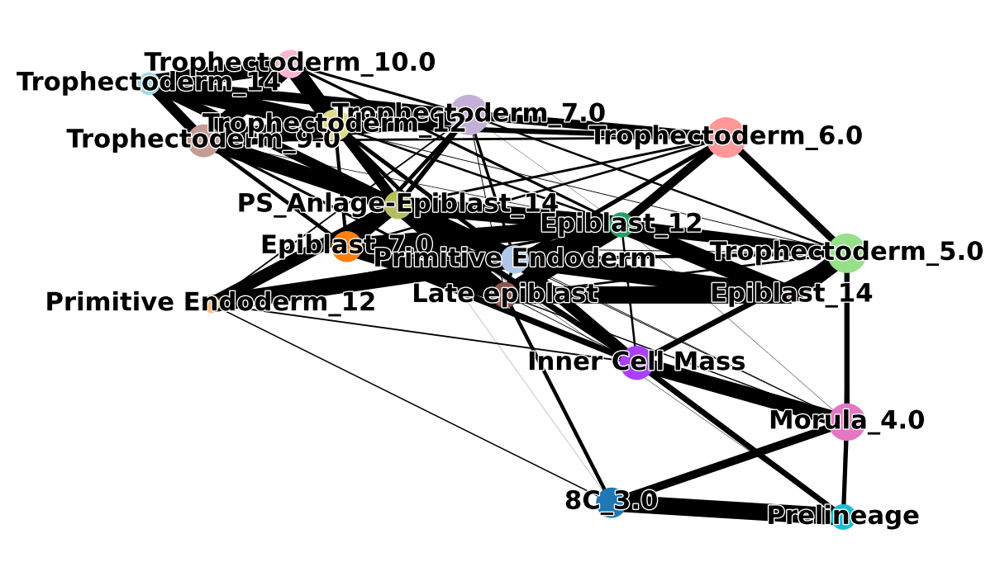

In [58]:
USE_REP = 'X_scVI'

sc.pp.neighbors(extended_adata, use_rep=USE_REP)
sc.tl.leiden(extended_adata, resolution=0.8)
sc.tl.pca(extended_adata)
sc.tl.draw_graph(extended_adata, n_jobs=8, random_state=3)

sc.pp.neighbors(extended_adata, use_rep=USE_REP)
sc.tl.diffmap(extended_adata)

sc.tl.paga(extended_adata, groups='C_scANVI_ns15')
sc.pl.paga(extended_adata, color=['C_scANVI_ns15'], frameon=False, fontoutline=True)
sc.tl.draw_graph(extended_adata, init_pos='paga', n_jobs=10)

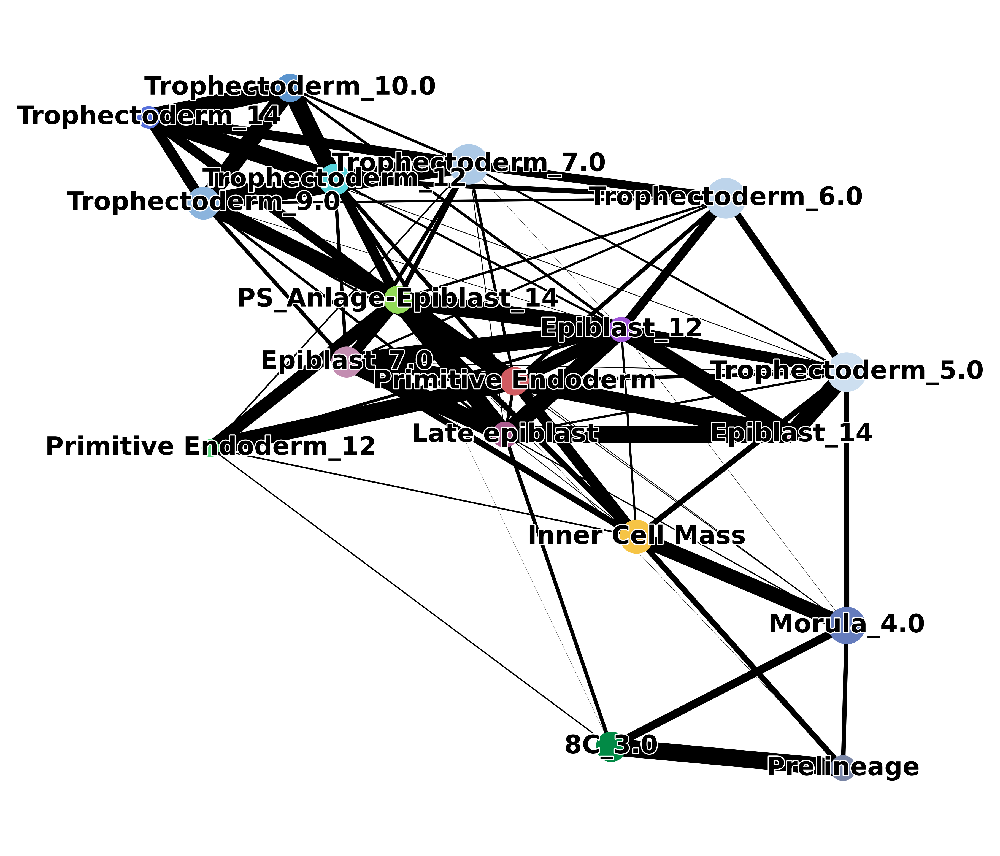

In [92]:
with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": (300)}):
    sc.pl.paga(extended_adata, color=['C_scANVI_ns15'], frameon=False, fontoutline=True)

In [79]:
ct_colors = {
    'Prelineage': '#7985A5',
    '8C_3.0': '#028A46',
    'Morula_4.0': '#657cbd',
    'Inner Cell Mass': '#F6C445',
    'Primitive Endoderm': '#D05B61',
    'Epiblast_6.0': '#d6b2ca',
    'Epiblast_7.0': '#c38db1',
    'Late epiblast': '#aa5c8f',
    'Trophectoderm_5.0': '#cddff0',
    'Trophectoderm_6.0': '#bdd4eb',
    'Trophectoderm_7.0': '#acc9e6',
    'Trophectoderm_8.0': '#9cbfe2',
    'Trophectoderm_9.0': '#8bb4dd',
    'Trophectoderm_10.0': '#5a94ce',
    'Unknown': '#F1BD93',
    
    'Epiblast_12': '#a157db',
    'Epiblast_14': '#db57b2',
    'PS_Anlage-Epiblast_14': '#91db57',
    'Primitive Endoderm_12': '#57db80',
    'Trophectoderm_12': '#57d3db',
    'Trophectoderm_14': '#5770db'
}
extended_adata.uns['C_scANVI_ns15_colors'] = [ct_colors[x] for x in extended_adata.obs.C_scANVI_ns15.cat.categories]

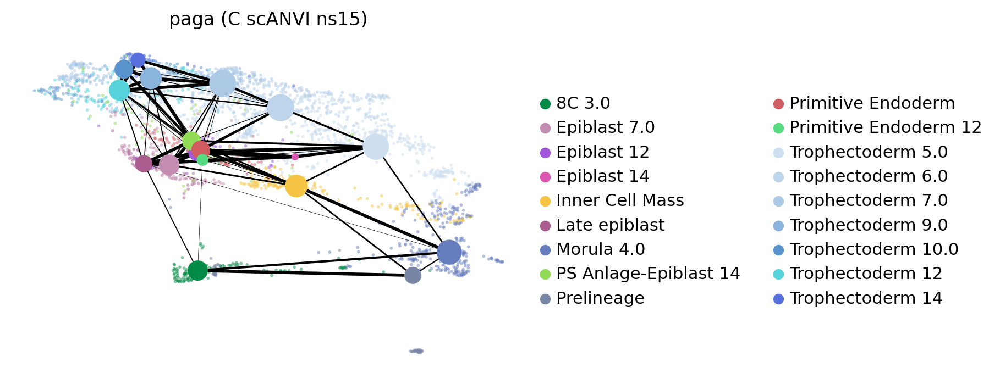

In [220]:
# with plt.rc_context({"figure.figsize": (6, 6), "figure.dpi": (150)}):
g = scv.pl.paga(extended_adata, basis='draw_graph_fa', threshold=.05, frameon=False, legend_loc='center right', show=False)
g.figure.savefig('../figures/13_extended_human_ns15_paga.svg')

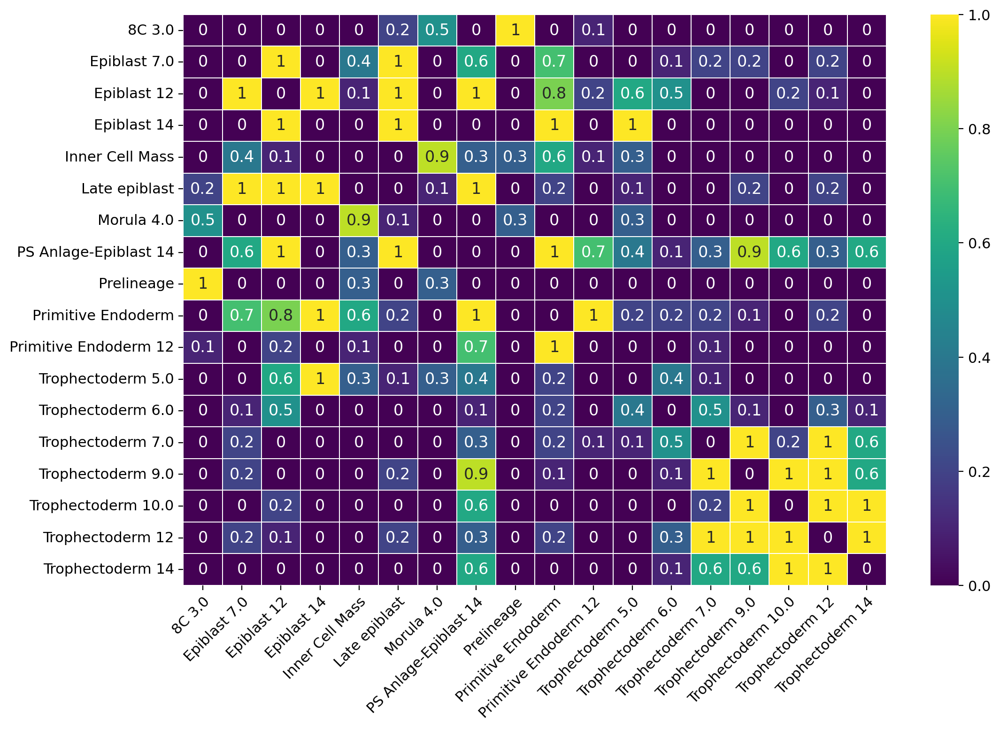

In [221]:
plt.figure(figsize=[12,8])
ax = sns.heatmap(
    scv.get_df(extended_adata, 'paga/connectivities',
           index=extended_adata.obs.C_scANVI_ns15.cat.categories.str.replace('_', ' '), 
           columns=extended_adata.obs.C_scANVI_ns15.cat.categories.str.replace('_', ' '))\
    .T \
    .round(1),
    cmap='viridis', linewidths=0.1, annot=True
)
_ = plt.xticks(rotation = 45, ha='right', rotation_mode='anchor')
plt.savefig('../figures/13_extended_human_ns15_matrix.svg')

### Mazid et al., 2022

In [6]:
# !wget "https://figshare.com/ndownloader/files/31382491?private_link=a1b03a1463865b8a56c8" -O ../data/external/Mazid_et_al_2022/SMART-seq_804Cell.csv.gz

In [147]:
# get_ensembl_genes('hsapiens')
genes = pd.read_csv(f"../data/external/hsapiens_gene_ensembl.csv")
mazid = sc.read_csv("../data/external/Mazid_et_al_2022/SMART-seq_804Cell.csv").T

genes_to_keep = mazid.var.reset_index().merge(genes, how='left', left_on='index', right_on='Gene name').dropna()
mazid = mazid[:, genes_to_keep['index']].copy()
mazid.var['ensembl_id'] = genes_to_keep['Gene stable ID'].values
mazid.var = mazid.var.reset_index(names='symbol').set_index('ensembl_id')

In [148]:
mazid.layers['counts'] = mazid.X
mazid.obs['batch'] = 'Mazid_et_al'
mazid.obs['experiment'] = 'Mazid_et_al'
mazid.obs['stage'] = [x[0] for x in mazid.obs.index.str.split('_')]

In [149]:
lvae_mazid = scvi.model.SCANVI.load("../results/02_human_integration/05_scanvi_ns15/")
scvi.model.SCANVI.prepare_query_anndata(mazid, lvae_mazid)

lvae_q_mazid = scvi.model.SCANVI.load_query_data(mazid, lvae_mazid)
lvae_q_mazid.train(max_epochs=100, plan_kwargs=dict(weight_decay=0.0), check_val_every_n_epoch=10)

INFO     File ../results/02_human_integration/05_scanvi_ns15/model.pt already downloaded                           
INFO     Found 70.7% reference vars in query data.                                                                 
INFO     Training for 100 epochs.                                                                                  


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Epoch 100/100: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:12<00:00,  8.16it/s, v_num=1, train_loss_step=8.74e+3, train_loss_epoch=8.73e+3]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.69it/s, v_num=1, train_loss_step=8.74e+3, train_loss_epoch=8.73e+3]


In [150]:
mazid.obs['prediction'] = lvae_q_mazid.predict()
mazid.obs['entropy'] = 1 - lvae_q_mazid.predict(soft=True).max(axis=1)

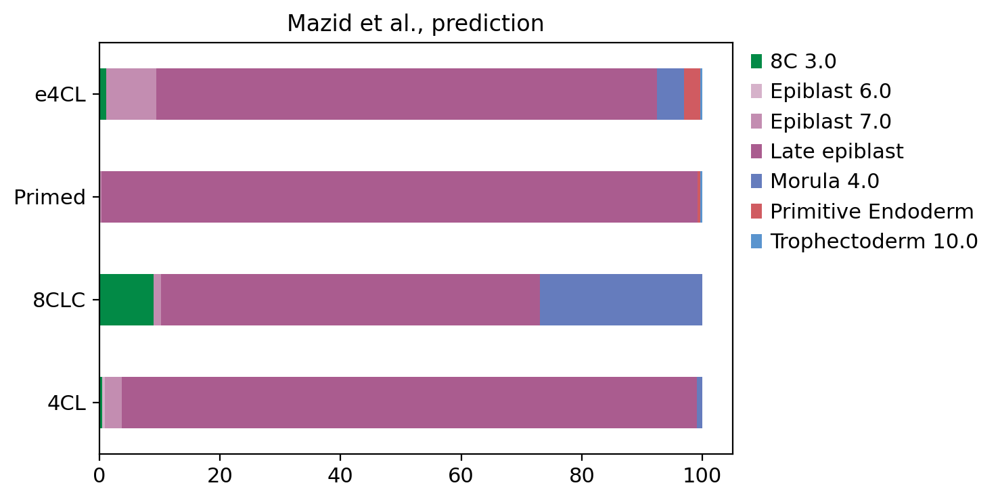

In [168]:
df = sc.metrics.confusion_matrix('stage', 'prediction', mazid.obs) * 100
df.plot.barh(stacked=True, color=ct_colors)
plt.legend(bbox_to_anchor=(1, 1.02), frameon=False, labels=df.columns.str.replace('_', ' '))
plt.title('Mazid et al., prediction')
plt.ylabel('')
plt.savefig('../figures/13_mazid.svg')

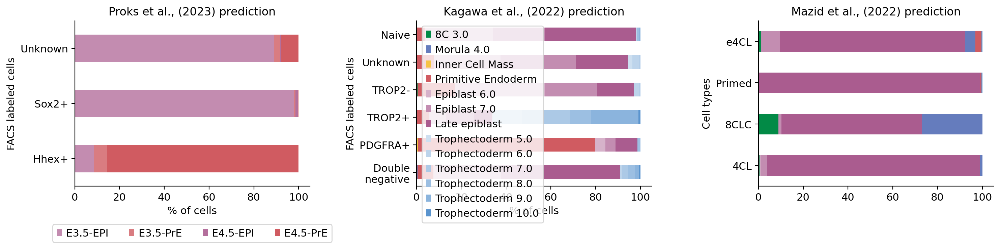

In [222]:
mouse_ct_colors = {
    'Zygote': '#7985A5',
    '2C': '#B3C81E',
    '4C': '#67BB30',
    '8C': '#028A46',
    '16C': '#657cbd',
    'E3.25-ICM': '#fadc8f',
    'E3.25-TE': '#5185b9',
    'E3.5-ICM': '#f8d06a',
    'E3.5-TE': '#7ba9d8',
    'E3.5-EPI': '#c38cb0',
    'E3.5-PrE': '#d97c81',
    'E3.75-ICM': '#F6C445',
    'E4.5-TE': '#5a94ce',
    'E4.5-EPI': '#B46F9C',
    'E4.5-PrE': '#D05B61'
}

fig, ax = plt.subplots(1, 3, figsize=[15, 4])
# mouse
conf_mat = (sc.metrics.confusion_matrix('FACS', 'predictions', sc.read("../results/06_proks_et_al.h5ad").obs) * 100)
conf_mat.plot.barh(stacked=True, color=mouse_ct_colors, ax=ax[0])
ax[0].legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), fancybox=True, ncol=5)
ax[0].set_xlabel('% of cells')
ax[0].set_ylabel('FACS labeled cells')
ax[0].set_title('Proks et al., (2023) prediction')

# human
conf_mat = pd.read_csv("../results/00_human_query.csv", index_col=0)
conf_mat = conf_mat.div(conf_mat.sum(axis=1), axis=0) * 100
conf_mat.index = ['Double\nnegative', 'PDGFRA+', 'TROP2+', 'TROP2-', 'Unknown', 'Naive']
conf_mat.plot.barh(stacked=True, color=ct_colors, ax=ax[1])
ax[1].legend(conf_mat.columns.str.replace('_', ' '))
ax[1].set_xlabel('% of cells')
ax[1].set_ylabel('FACS labeled cells')
ax[1].set_title('Kagawa et al., (2022) prediction')

# Mazid
df = sc.metrics.confusion_matrix('stage', 'prediction', mazid.obs) * 100
df.plot.barh(stacked=True, color=ct_colors, ax=ax[2], legend=None)
ax[2].set_ylabel('Cell types')
# plt.legend(bbox_to_anchor=(1, 1.02), frameon=False, labels=df.columns.str.replace('_', ' '))
ax[2].set_title('Mazid et al., (2022) prediction')

for ax_ in ax:
    ax_.spines[['right', 'top']].set_visible(False)

fig.tight_layout()
fig.savefig('../figures/13_all_invitro_preds.svg')